In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
plt.rcParams.update({
    'figure.figsize': (4.8, 2.7), 'font.size': 15, 'lines.linewidth': 2,
    'xtick.labelsize': 'small', 'ytick.labelsize': 'small',
    'axes.spines.top': False, 'axes.spines.right': False,
    'savefig.dpi': 100,
})

import os, torch, pickle
import numpy as np

# Load one episode of a trained agent

In [2]:
with open('episode.pickle', 'rb') as f:
    saved = pickle.load(f)
states = saved['states']
observations = saved['observations']
actions = saved['actions']
rewards = saved['rewards']
beliefs = saved['beliefs']
infos = saved['infos']

In [3]:
print('state: {}'.format(states.shape))
print('observation: {}'.format(observations.shape))
print('action: {}'.format(actions.shape))
print('reward: {}'.format(rewards.shape))
print('belief: {}'.format(beliefs.shape))

state: (1201, 8)
observation: (1201, 6)
action: (1200,)
reward: (1200,)
belief: (1201, 98)


State is an 8-dim vector:
- dim 1 is an integer in [0, 18] for monkey position
- dim 2 is an integer in [0, 18] for monkey gaze
- dim 3 is an integer in [0, 1] for food availability in box 1
- dim 4 is an integer in [0, 9] for cue level of box 1
- dim 5 is an integer in [0, 1] for food availability in box 2
- dim 6 is an integer in [0, 9] for cue level of box 2
- dim 7 is an integer in [0, 1] for food availability in box 3
- dim 8 is an integer in [0, 9] for cue level of box 3

Observation is a 6-dim vector:
- dim 1 is an integer in [0, 18] for monkey position
- dim 2 is an integer in [0, 18] for monkey gaze
- dim 3 is an integer in [0, 8] for color on box 1, 0-7 means blue to red, and 8 means not being looked at
- dim 4 is an integer in [0, 8] for color on box 2
- dim 5 is an integer in [0, 8] for color on box 3
- dim 6 is an integer in [0, 1], indicating whether the reward is collected or not at this step

Action is an integer in [0, 417], see `hexarena.monkey.Monkey.convert_action` for more details.

Reward is a float number. Getting a reward is `+10`, while each push is `-1`. Actions like moving and turning also result negative rewards.

Belief is a 98-dim vector:
- dim 0-18 is the logits for a distribution of monkey position, it is usually one-hot like since position is fully observed
- dim 19-37 is the logits for a distribution of monkey gaze, it is usually one-hot like since gaze is fully observed
- dim 38-57 is the logits for box 1 state, corresponding to dim 3-4 in state
- dim 58-77 is the logits for box 2 state, corresponding to dim 5-6 in state
- dim 78-97 is the logits for box 3 state, corresponding to dim 7-8 in state

# Convert numpy arrays to intepretable variables

In theory, you don't need an environment to do the conversion. But with a `hexarena.SimilarBoxForagingEnv` environment, it will be easier.
Run this notebook at the same level of `hexarena`.

Required packages:
- `jarvis>=0.7`[https://github.com/lizhe07/jarvis]
- `scipy`
- `gymnasium`

In [4]:
from hexarena.env import SimilarBoxForagingEnv

env = SimilarBoxForagingEnv(
    box={
        '_target_': 'hexarena.box.StationaryBox', 'num_patches': 1, 'num_levels': 10, 'num_grades': 8,
    },
    boxes=[{'tau': tau} for tau in [15, 21, 35]],
)

The following codes show how to convert `states`, `observations`, `actions`, `rewards` to interpretable variables. You can load them from the pickle file directly if you want to skip them.
```python
pos = saved['pos']
gaze = saved['gaze']
foods = saved['foods']
colors = saved['colors']
counts = saved['counts']
p_boxes = saved['p_boxes']
```

In [5]:
from scipy.special import softmax

pos, gaze, rewarded, foods, colors, counts = [], [], [], [], [], []
counts_t = np.zeros((env.num_boxes, 2))
for t, info in enumerate(infos):
    pos.append(info['pos'])
    gaze.append(info['gaze'])
    if t==0:
        rewarded.append(None)
    else:
        push, move, _ = env.monkey.convert_action(actions[t-1])
        if push:
            success = rewards[t-1]>0
            b_idx = env.arena.boxes.index(move)
            rewarded.append(success)
            counts_t[b_idx, 0] += int(success)
            counts_t[b_idx, 1] += 1
        else:
            rewarded.append(None)
    foods.append(info['foods'])
    colors.append(info['colors'])
    counts.append(counts_t.copy())
pos = np.array(pos).astype(int)
gaze = np.array(gaze).astype(int)
foods = np.array(foods).astype(bool)
colors = np.array(colors).astype(int)
counts = np.stack(counts).astype(int)

p_boxes = []
for belief in beliefs:
    ps = []
    for i in range(3):
        logits = belief[(38+i*20):(58+i*20)]
        ps.append(softmax(logits).reshape(2, -1))
    p_boxes.append(np.stack(ps))
p_boxes = np.stack(p_boxes)

# Play animation of one episode

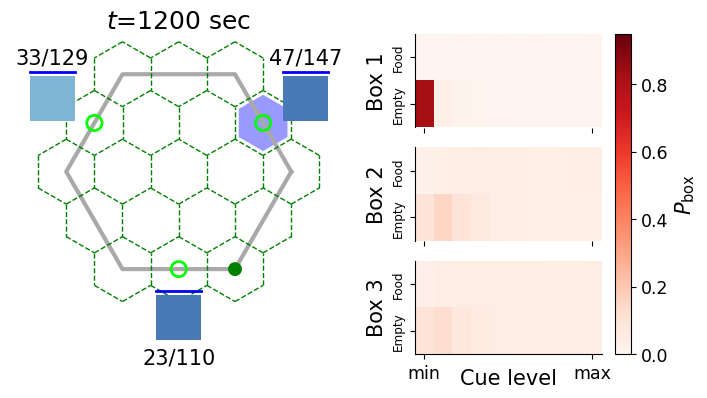

In [6]:
from IPython.display import HTML
fig, ani = env.play_episode(pos, gaze, rewarded, foods, colors, counts, p_boxes, tmin=1000)
HTML(ani.to_jshtml())
# ani.save('episode.mp4')